<a href="https://colab.research.google.com/github/sasyi127/KKP-FINAL/blob/main/full_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom

In [ ]:
base_dir = '/content/drive/MyDrive/KKP Batik/DATA'
!ls = '/content/drive/MyDrive/KKP Batik/DATA'

ls: cannot access '=': No such file or directory
'/content/drive/MyDrive/KKP Batik/DATA':
test  train  val


In [ ]:
train_dir =  os.path.join(base_dir, 'train')    #Direktori Train
validation_dir = os.path.join(base_dir, 'val')  #Direktori Vaildation
test_dir =  os.path.join(base_dir, 'test')      #Direktori untuk testing

In [ ]:
# Memberikan nilai awal untuk batch size, ukuran gambar dan jumlah epochs

BATCH_SIZE = 64  #Variabel Batch Size sebesar 64 artinya proses akan dilakukan per 64 gambar untuk satu putaran
IMG_HEIGHT = 150 # Ukuran Tinggi Gambar
IMG_WIDHT = 150  # Ukuran Lebar Gambar

In [ ]:
train_dataset = image_dataset_from_directory(train_dir,                 # Memanggil Direktori Train
                                             shuffle=True,              # Aktifasi Pengacakan
                                             batch_size=BATCH_SIZE,     # 64 Batch Size
                                             label_mode="categorical",  # Mode Categorical digunakan karena data kami merupakan data multiclass
                                             color_mode='rgb',          # Mode warna RGB
                                             image_size=(IMG_HEIGHT, IMG_WIDHT)) # Pengaturan image size

validation_dataset = image_dataset_from_directory(validation_dir,       # Memanggil Direktori Val
                                             shuffle=True,              # Aktifasi Pengacakan
                                             batch_size=BATCH_SIZE,     # 64 Batch Size
                                             label_mode="categorical",  # Mode Categorical digunakan karena data kami merupakan data multiclass
                                             color_mode='rgb',          # Mode warna RGB
                                             image_size=(IMG_HEIGHT, IMG_WIDHT)) # Pengaturan image size

test_dataset = image_dataset_from_directory(test_dir,                   # Memanggil Direktori test
                                             shuffle=True,              # Aktifasi Pengacakan
                                             batch_size=BATCH_SIZE,     # 64 Batch Size
                                             label_mode="categorical",  # Label Mode menggunakan categorical karena multiclass
                                             color_mode='rgb',          # Mode warna RGB
                                             image_size=(IMG_HEIGHT, IMG_WIDHT))# Pengaturan image size

Found 2716 files belonging to 14 classes.
Found 776 files belonging to 14 classes.
Found 388 files belonging to 14 classes.


In [ ]:
class_names = train_dataset.class_names
print(class_names)

['Batik Bali', 'Batik Betawi', 'Batik Cendrawasih', 'Batik Dayak', 'Batik Geblek Renteng', 'Batik Ikat Celup', 'Batik Insang', 'Batik Kawung', 'Batik Lasem', 'Batik Megamendung', 'Batik Parang', 'Batik Poleng', 'Batik Sekar Jagad', 'Batik Tambal']


In [ ]:
# Menggunakan AUTOTUNE keras

AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) # Buffersize per 1000 gambar acak dituning untuk train data
validation_dataset = validation_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) # Buffersize per 1000 gambar acak dituning untuk validation data
test_dataset = test_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) # Buffersize per 1000 gambar acak dituning untuk test data

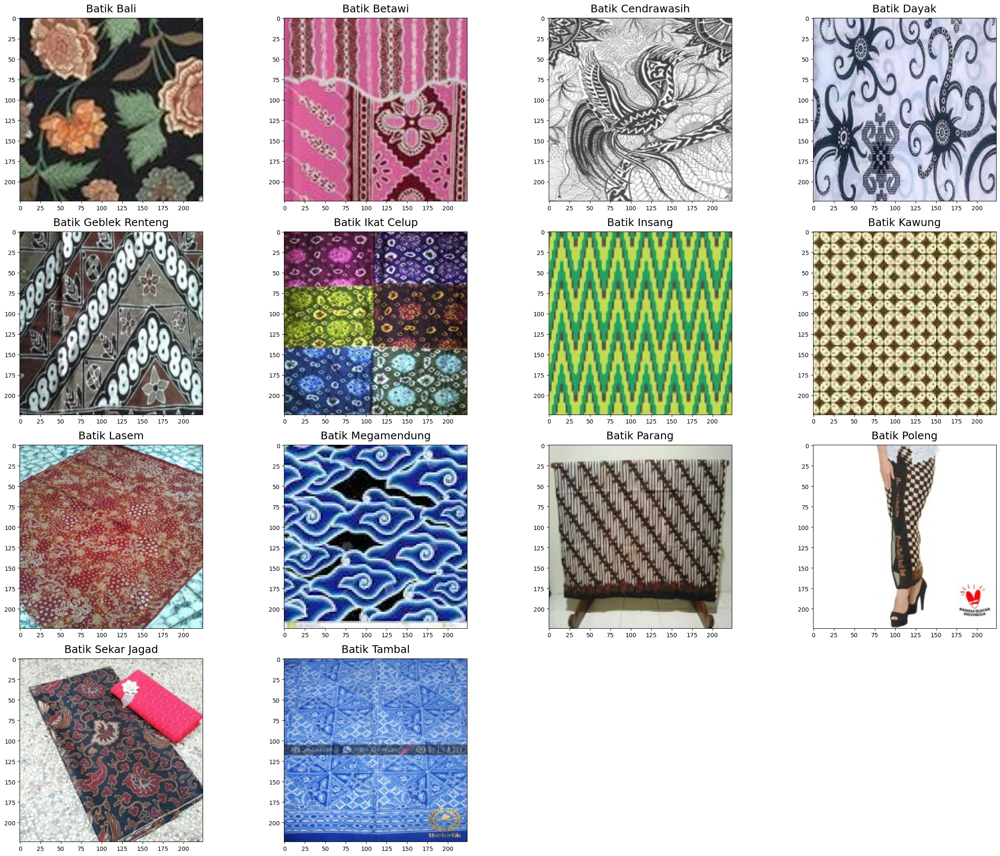

In [ ]:
#Melihat distribusi gambar dan labeling

import random
train_folder = train_dir #Membuat variabel baru dengan nama train_folder
images = []

for motif_folder in sorted(os.listdir(train_folder)): # Perulangan untuk disetiap food folder yang didefinisikan sebagai train folder
    motif_items = os.listdir(train_folder + '/' + motif_folder) # Masukkan food items
    motif_selected = np.random.choice(motif_items)
    images.append(os.path.join(train_folder,motif_folder,motif_selected))

# Melakukan Plotting dan visualisasi gambar

fig=plt.figure(1, figsize=(25, 25))

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)

plt.tight_layout()

In [ ]:
# Menambahkan beberapa library yang diperlukan

from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
import math

In [ ]:
# Membuat Model CNN
model = keras.models.Sequential([
    layers.Conv2D(filters=32,
                  kernel_size=(3, 3),
                  activation='relu',
                  input_shape=(150, 150, 3),
                  padding='same'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(filters=64,
                  kernel_size=(3, 3),
                  activation='relu',
                  padding='same'),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(filters=128,
                  kernel_size=(3, 3),
                  activation='relu',
                  padding='same'),
    layers.MaxPooling2D(2, 2),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.BatchNormalization(),
    layers.Dense(14, activation='softmax')
    ])

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 150, 150, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 75, 75, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 75, 75, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 37, 37, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 37, 37, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 18, 18, 128)     

In [ ]:
# Melakukan Compiling model menggunakan optimizer, Loss dan metrics yang sesuai

adam = tf.keras.optimizers.Adam(learning_rate = 0.0001)
model.compile(optimizer='adam',
              loss= 'categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
 # Melakukan training model

history = model.fit(     # Training data
    train_dataset,                       # Masukkan data yang akan di train yaitu train dataset
    validation_data=validation_dataset,  # Masukkan data yang akan di validasi yaitu validation dataset
    epochs= 30,                      # Masukkan epoch sebanyak 10 kali
    verbose=1                            # Verbose
)

Epoch 1/30
43/43 [==============================] - 190s 4s/step - loss: 2.7786 - accuracy: 0.0965 - val_loss: 4.3774 - val_accuracy: 0.1173
Epoch 2/30
43/43 [==============================] - 185s 4s/step - loss: 2.5772 - accuracy: 0.1410 - val_loss: 2.9347 - val_accuracy: 0.1211
Epoch 3/30
43/43 [==============================] - 182s 4s/step - loss: 2.3804 - accuracy: 0.2264 - val_loss: 2.7286 - val_accuracy: 0.1456
Epoch 4/30
43/43 [==============================] - 175s 4s/step - loss: 2.2535 - accuracy: 0.3019 - val_loss: 4.1312 - val_accuracy: 0.1250
Epoch 5/30
43/43 [==============================] - 183s 4s/step - loss: 2.1471 - accuracy: 0.3328 - val_loss: 2.5384 - val_accuracy: 0.1482
Epoch 6/30
43/43 [==============================] - 185s 4s/step - loss: 2.0098 - accuracy: 0.4057 - val_loss: 2.5126 - val_accuracy: 0.2036
Epoch 7/30
43/43 [==============================] - 184s 4s/step - loss: 1.7401 - accuracy: 0.5166 - val_loss: 2.4496 - val_accuracy: 0.2835
Epoch 8/30
43

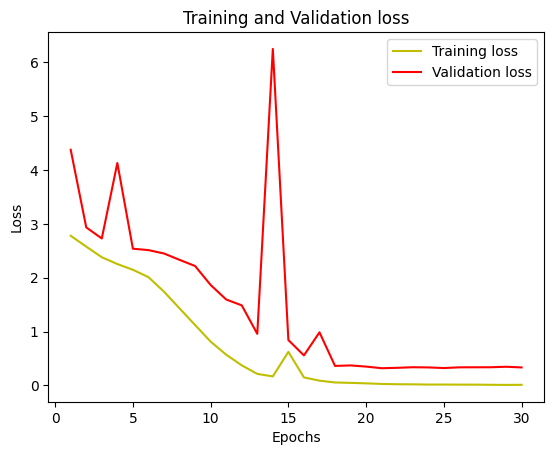

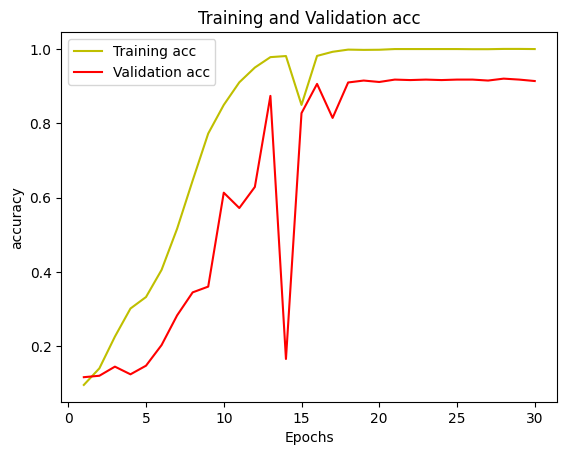

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss)+1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(loss)+1)
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and Validation acc')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [ ]:
# Melakukan evaluasi model yang telah di train terhadap data pengujian

test_accuracy = model.evaluate(test_dataset)
print("The test akurasi  : ", test_accuracy[1]*100, "%")

7/7 [==============================] - 55s 680ms/step - loss: 0.3348 - accuracy: 0.9124
The test akurasi  :  91.23711585998535 %


In [ ]:
# Menyimpan Model yang telah di train dengan format .h5
model.save('CNN_Model.h5')

In [ ]:
# Memanggil model yang telah tersimpan

model = tf.keras.models.load_model('/content/drive/MyDrive/KKP Batik/CNN_Model.h5')

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras import models
from PIL import Image
from skimage.io import imread
import cv2


category={
    0: ['bali','Bali'], 1: ['betawi','Betawi'], 2: ['cendrawasih','Cendrawasih'],
    3: ['dayak','Dayak'], 4: ['gblek renteng','Geblek Renteng'], 5: ['ikat celup','Ikat Celup'],
    6: ['insang','Insang'], 7: ['kawung','Kawung'], 8: ['lasem','Lasem'], 9: ['megamendung','Megamendung'],
    10: ['parang','Parang'], 11: ['poleng','Poleng'], 12: ['sekar jagad','Sekar Jagad'], 13: ['tambal','Tambal']
}

# Fungsi untuk memprediksi gambar ( hanya 1 file )
def predict_image(filename,model):
    img_ = image.load_img(filename, target_size=(150, 150))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 1.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediksi Gambar ini adalah - {}  ".format(category[index][1]))
    plt.imshow((img_array*1).astype(np.uint8))


# Fungsi untuk memprediksi gambar ( untuk 1 folder/direktori )
def predict_dir(filedir,model):
    cols=5
    pos=0
    images=[]
    total_images=len(os.listdir(filedir))
    rows=total_images//cols + 1

    true=filedir.split('/')[-1]

    fig=plt.figure(1, figsize=(25, 25))

    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir,i))

    for subplot,imggg in enumerate(images):
        img_ = image.load_img(imggg, target_size=(150, 150))
        img_array = image.img_to_array(img_)

        img_processed = np.expand_dims(img_array, axis=0)

        img_processed /= 1.
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)

        pred=category.get(index)[0]
        if pred==true:
            pos+=1

        fig=plt.subplot(rows, cols, subplot+1)
        fig.set_title(category.get(index)[1], pad = 10,size=18)
        plt.imshow((img_array*1).astype(np.uint8))

    acc=pos/total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc,pos=pos,total=total_images))
    plt.tight_layout()

1/1 [==============================] - 0s 41ms/step
Accuracy of Test : 0.00 (0/28)


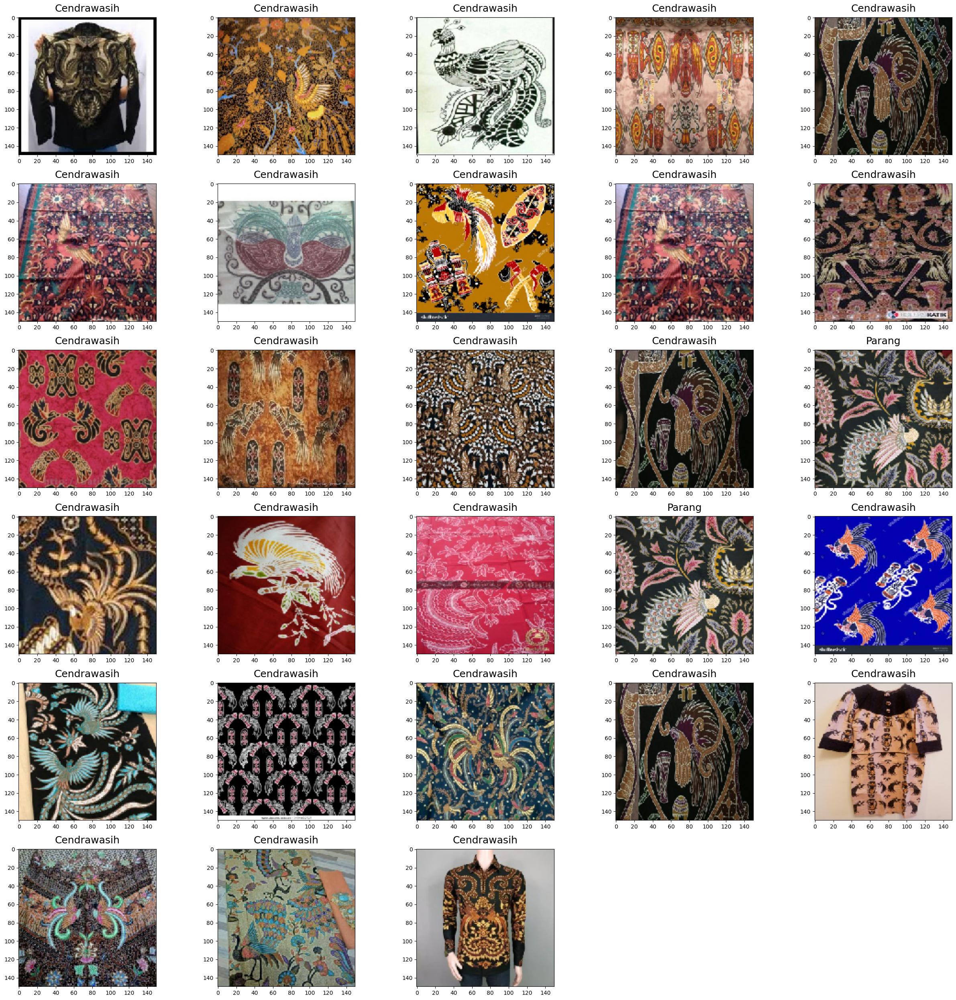

In [ ]:
predict_dir('/content/drive/MyDrive/KKP Batik/DATA/test/Batik Cendrawasih',model)

In [ ]:
from google.colab import files
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image



# get input image
uploaded = files.upload()



for fn in uploaded.keys():
  path = fn

# read image file using cv2
img = image.load_img(path, target_size=(150, 150))
img=img_to_array(img)
img=np.expand_dims(img,axis=0)
prediction = np.argmax(model.predict(img), axis=1)

if(prediction==0):
  print("Gambar ini adalah Motif Batik Bali")
elif(prediction==1):
  print("Gambar ini adalah Motif Batik Betawi")
elif(prediction==2):
  print("Gambar ini adalah Motif Batik Cendrawasih")
elif(prediction==3):
  print("Gambar ini adalah Motif Batik Dayak")
elif(prediction==4):
  print("Gambar ini adalah Motif Batik Geblek Renteng")
elif(prediction==5):
  print("Gambar ini adalah Motif Batik Ikat Celup")
elif(prediction==6):
  print("Gambar ini adalah Motif Batik Insang")
elif(prediction==7):
  print("Gambar ini adalah Motif Batik Kawung")
elif(prediction==8):
  print("Gambar ini adalah Motif Batik Lasem")
elif(prediction==9):
  print("Gambar ini adalah Motif Batik Megamendung")
elif(prediction==10):
  print("Gambar ini adalah Motif Batik Parang")
elif(prediction==11):
  print("Gambar ini adalah Motif Batik Poleng")
elif(prediction==12):
  print("Gambar ini adalah Motif Batik Sekar Jagad")
elif(prediction==13):
  print("Gambar ini adalah Motif Batik Tambal")